In [2]:
import sys
from pathlib import Path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))

from PIL import Image
import sys
from pathlib import Path
from PIL import Image
import torch
import numpy as np
from molmo_utils import load_model, do_inference, get_coordinates, calculate_probability_of_coordinates
from utils import extract_all, plot_scatter, calculate_normalized_euclidian_distance, visualize_points_on_image, calculate_spread, calculate_all_clusters, show_all_clusters

In [3]:
model_name = 'allenai/Molmo-7B-D-0924'
model, processor = load_model(model_name)

Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

In [19]:
def run_experiment(path_to_experiments, prompt_starts, prompt_ends, runs_per_task, temperature, epsilon, min_samples):
    tasks, images, ground_truths, objects = extract_all(path_to_experiments)
    softmax_fn = torch.nn.Softmax(dim=-1)
    labels = []

    coordinates = [[],[]]

    distances = [[],[]]
    
    spreads = [[],[]]

    diameters = [[],[]]

    majority_size_rates = [[],[]]

    #probs = [[],[]]
    
    for i in range(len(tasks)):
        task = tasks[i]
        labels.append(task)
        ground_truth = ground_truths[i]

        objects_of_task = objects[i]
        prompt_what = prompt_starts[0] + task + prompt_ends[0]
        prompt_where = prompt_starts[1] + task + prompt_ends[1]


        print(f"{task}")
        with Image.open(images[i]) as image:
            image_width = image.width
            image_height = image.height
    
            prompts = [prompt_what]
            if (len(ground_truth) == 2):
                prompts.append(prompt_where)
                labels.append(task)
    
            for k in range(len(prompts)):
                task_coordinates = []
                task_distances = []
                #probabilities = []
                
                for j in range(runs_per_task):
                    output_text, output, inputs = do_inference(image, prompts[k], model, processor, temperature)                    
                    coords = get_coordinates(output_text, image_width, image_height)
                    if(coords[0][0] < 0 or coords[0][1] < 0):
                        continue
                    
                    if len(coords) == 1:
                        norm_dist = calculate_normalized_euclidian_distance(coords[0], ground_truth[k], image_width, image_height)
                        task_coordinates += coords
                        task_distances.append(norm_dist)
                        #probabilities.append(calculate_probability_of_coordinates(output, inputs, processor))
                coordinates[k].append(task_coordinates)
                        

                n_clusters, index_majority_cluster, cluster_points, noisy_points, centroids, diameters_of_clusters = calculate_all_clusters(task_coordinates, epsilon=epsilon, min_samples=min_samples)
                if (n_clusters != 0):
                    norm_dist = calculate_normalized_euclidian_distance(centroids[index_majority_cluster], ground_truth[k], image_width, image_height)
                    distances[k].append(norm_dist)
                    spreads[k].append(calculate_spread(task_coordinates, image_width, image_height))
                    diameters[k].append(diameters_of_clusters[index_majority_cluster])
                    majority_size_rates[k].append(len(cluster_points[index_majority_cluster]) / len(task_coordinates))
                    #probs[k].append(np.mean(probabilities))
                    
                    show_all_clusters(image, index_majority_cluster, cluster_points, noisy_points, centroids, diameters_of_clusters)

                print("")

    return coordinates, distances, spreads, diameters, majority_size_rates#, probs


pick up the wooden block and place it on top of the arch.


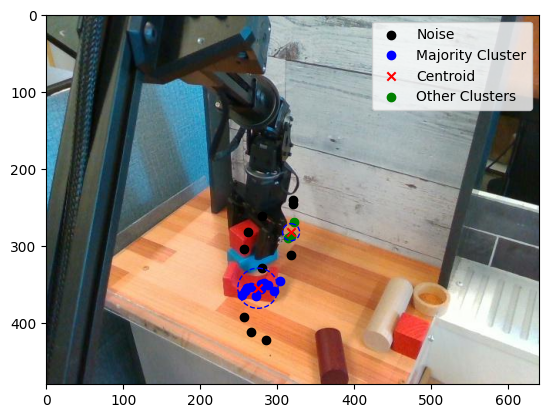

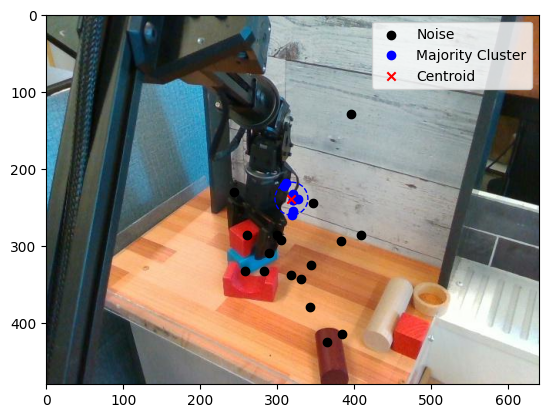


pick up vegetable and put it on the table.


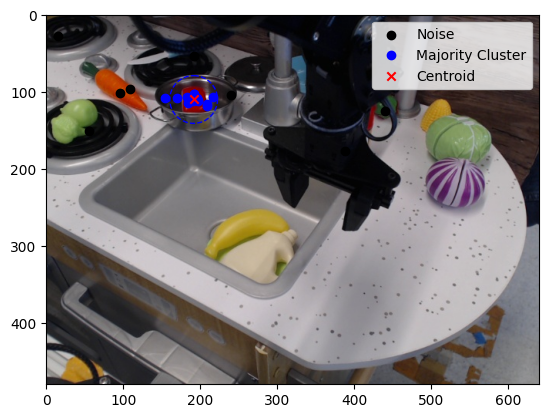

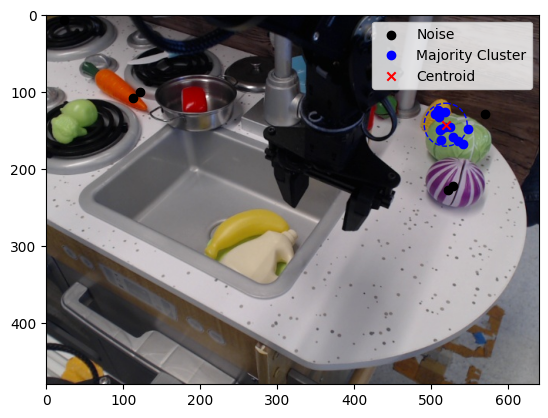


pick up glass cup


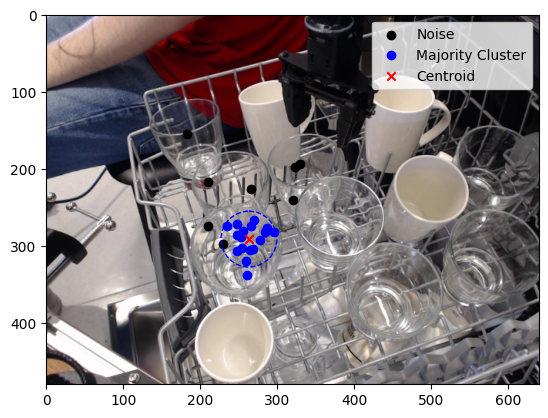


pick up red srewdriver


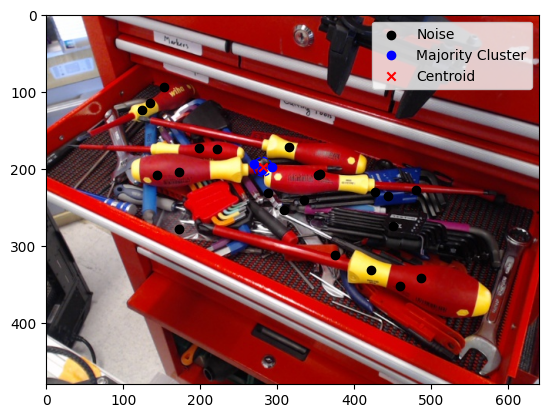


pick up the bean.


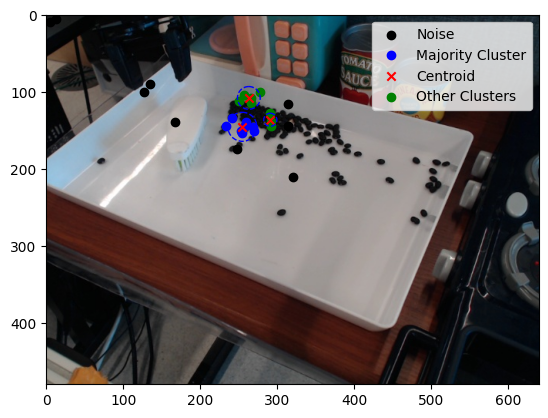


pick up the diamond.


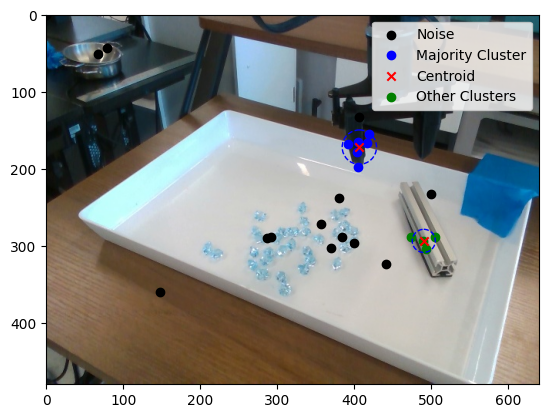


pick up vegetable and put it on the green cutting board.


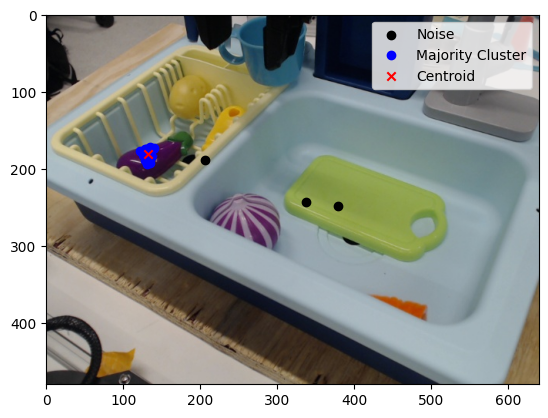

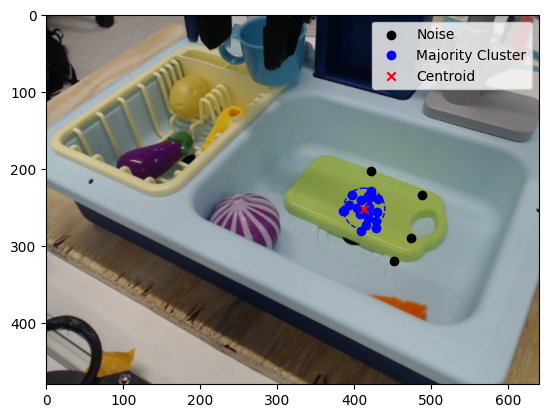


pick up cloth.


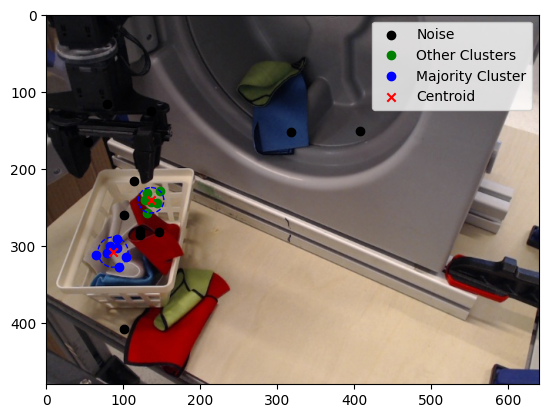


pick up vegetable from the sink and put it on the right side of the sink.


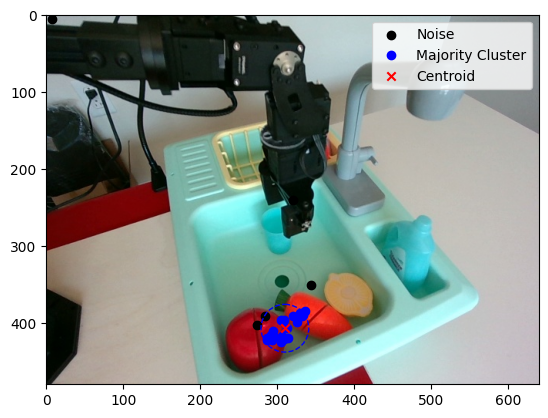

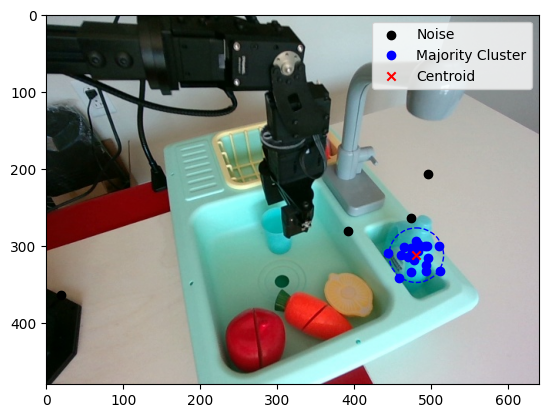


pick up the can and put it next to the tomato.


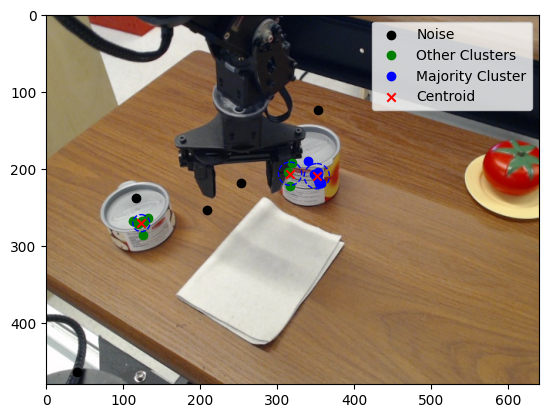

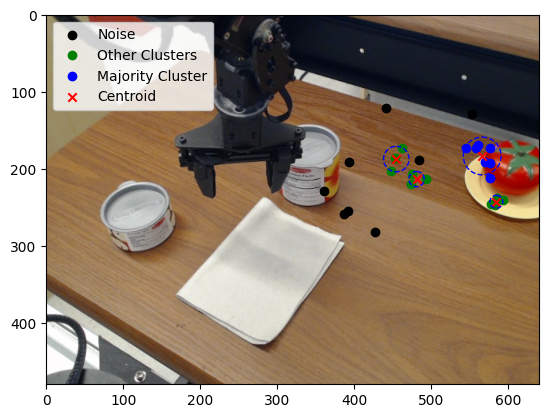

ValueError: not enough values to unpack (expected 8, got 5)

In [16]:
experiment_path = "../data/uncertain_experiments"
num_runs = 25
temperature = 0.8

epsilon = 20
min_samples = 3

prompt_starts = ["You are the robot in the picture. Your mission it to guide and support the user in its task to: ", "You are the robot in the picture. Your mission it to guide and support the user in its task to: "]
prompt_ends = [" For that you have to point to the relevant object in the picture. Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the object to move. Dont output anything else.", " For that you have to point to the place in the picture where the object has to be moved to. Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the place where the object has to be moved to. Dont output anything else."]

coordinates, distances, spreads, diameters, majority_size_rates, probs, images, tasks = run_experiment(experiment_path, prompt_starts, prompt_ends, num_runs, temperature, epsilon, min_samples)

In [22]:
def run_experiment_different_prompts(path_to_experiments, prompt_starts, runs_per_task, temperature, epsilon, min_samples):
    tasks, images, ground_truths, objects = extract_all(path_to_experiments)
    prompt_end = " Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the relevant object. Dont output anything else."
    softmax_fn = torch.nn.Softmax(dim=-1)
    labels = []

    coordinates = [[],[]]

    distances = [[],[]]
    
    spreads = [[],[]]

    diameters = [[],[]]

    majority_size_rates = [[],[]]


    #probs = [[],[]]
    
    for i in range(len(tasks)):
        prompts = []
        task = tasks[i]
        labels.append(task)
        ground_truth = ground_truths[i]

        objects_of_task = objects[i]
        prompts_what = []
        for prompt_start in prompt_starts:
            prompt = prompt_start + task + "For that you have to point to the object in the picture that has to be moved." + prompt_end
            prompts_what.append(prompt)

        prompts.append(prompts_what)


        print(f"{task}")
        with Image.open(images[i]) as image:
            image_width = image.width
            image_height = image.height
    
            if (len(ground_truth) == 2):
                prompts_where = []
                for prompt_start in prompt_starts:
                    prompt = prompt_start + task + "For that you have to point to the place in the picture where the object has to be moved to." +  prompt_end
                    prompts_where.append(prompt)
                labels.append(task)
                prompts.append(prompts_where)
    
            for k in range(len(prompts)):
                task_coordinates = []
                task_distances = []
                #probabilities = []

                for prompt in prompts[k]:
                    for j in range(runs_per_task):
                        output_text, output, inputs = do_inference(image, prompt, model, processor, temperature)                    
                        coords = get_coordinates(output_text, image_width, image_height)
                        if(coords[0][0] < 0 or coords[0][1] < 0):
                            continue
                        
                        if len(coords) == 1:
                            norm_dist = calculate_normalized_euclidian_distance(coords[0], ground_truth[k], image_width, image_height)
                            task_coordinates += coords
                            task_distances.append(norm_dist)
                            #probabilities.append(calculate_probability_of_coordinates(output, inputs, processor))
                    coordinates[k].append(task_coordinates)
                            
    
                n_clusters, index_majority_cluster, cluster_points, noisy_points, centroids, diameters_of_clusters = calculate_all_clusters(task_coordinates, epsilon=epsilon, min_samples=min_samples)
                if (n_clusters != 0):
                    norm_dist = calculate_normalized_euclidian_distance(centroids[index_majority_cluster], ground_truth[k], image_width, image_height)
                    distances[k].append(norm_dist)
                    spreads[k].append(calculate_spread(task_coordinates, image_width, image_height))
                    diameters[k].append(diameters_of_clusters[index_majority_cluster])
                    majority_size_rates[k].append(len(cluster_points[index_majority_cluster]) / len(task_coordinates))
                    #probs[k].append(np.mean(probabilities))
                    show_all_clusters(image, index_majority_cluster, cluster_points, noisy_points, centroids, diameters_of_clusters)
                else:
                    visualize_points_on_image(image, ["predictions"], [task_coordinates], object)
                    

                print("")

    return coordinates, distances, spreads, diameters, majority_size_rates#, probs


pick up the wooden block and place it on top of the arch.


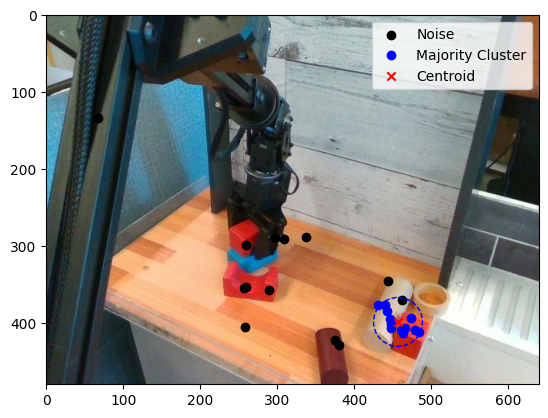


Didnt find any cluster


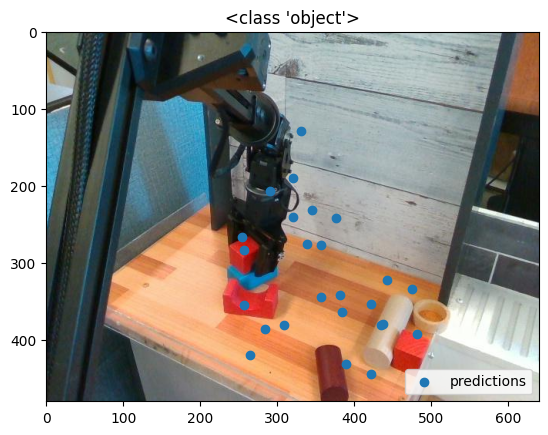


pick up vegetable and put it on the table.


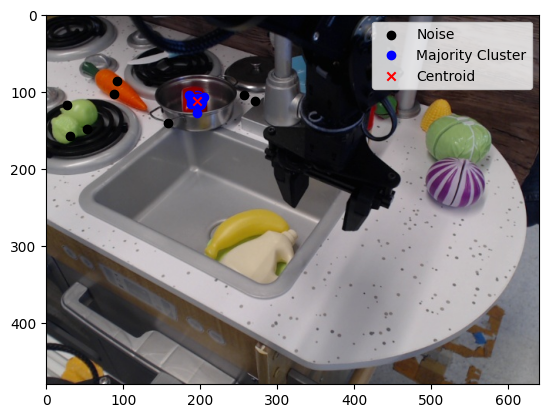

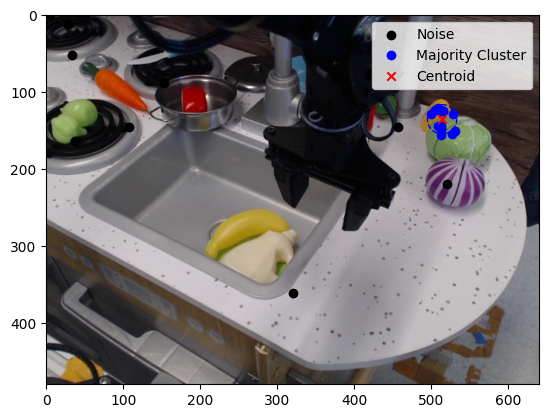


pick up glass cup


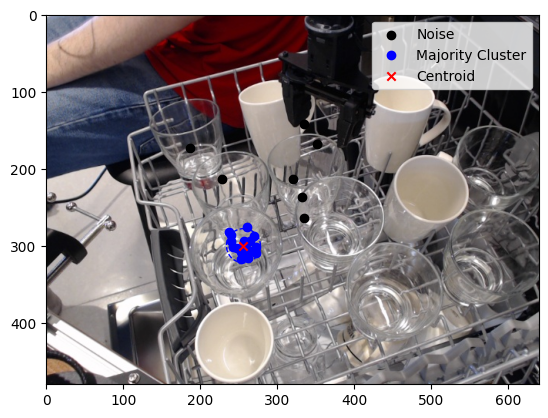


pick up red srewdriver


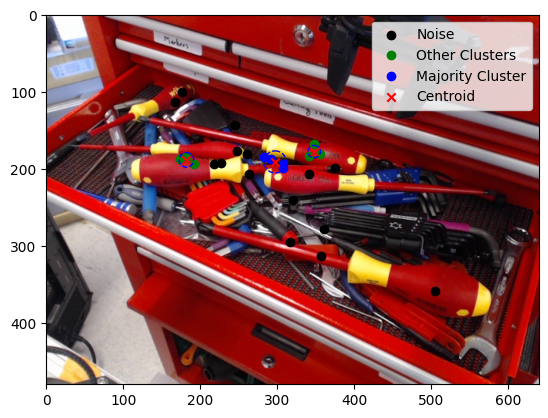


pick up the bean.


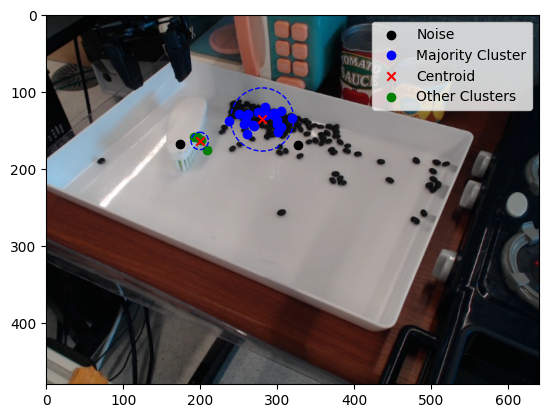


pick up the diamond.


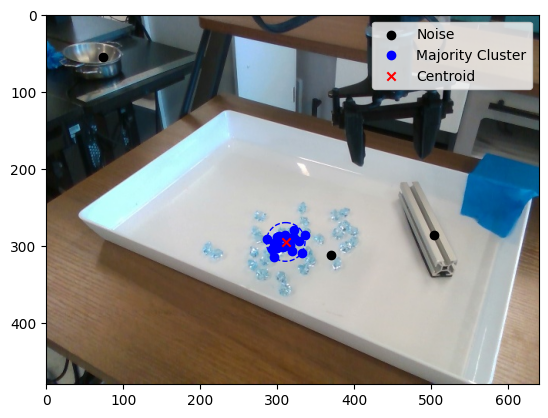


pick up vegetable and put it on the green cutting board.


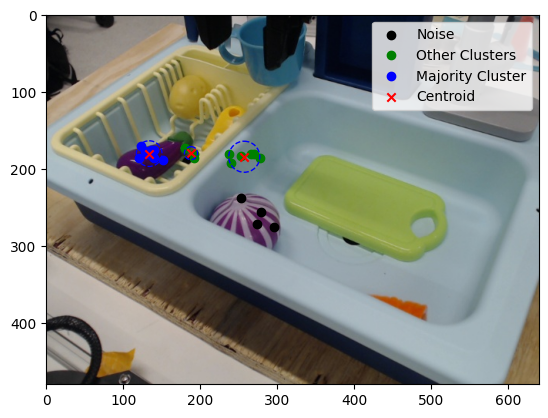

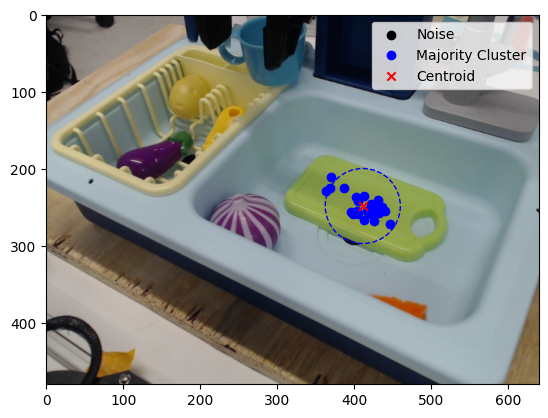


pick up cloth.


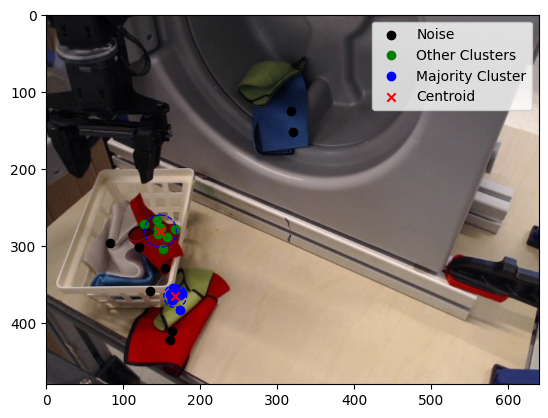


pick up vegetable from the sink and put it on the right side of the sink.


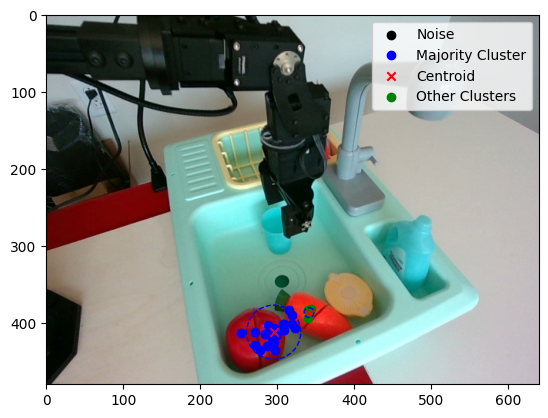

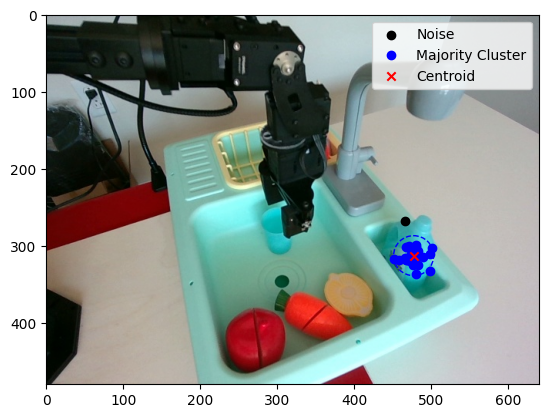


pick up the can and put it next to the tomato.


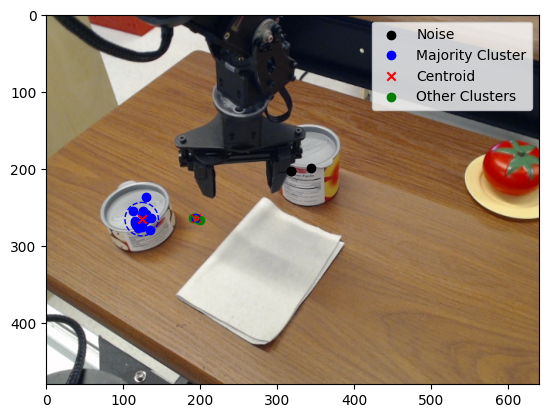

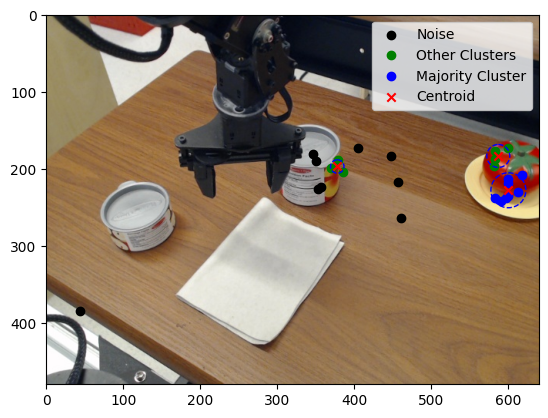

In [23]:
experiment_path = "../data/uncertain_experiments"
num_runs = 5
temperature = 0.8

epsilon = 20
min_samples = 3

prompt_starts = [
    "You are the robot in the picture. Your mission it to guide and support the user in its task to: ",
    "Your mission it to guide and support the user in its task to: ",
    "You are the robot in the picture. You have to: ",
    "You are the robot. Your mission is to: ",
    "You are the robot in the picture. Your task is to: "
    ]

#prompt_starts = ["You are the robot in the picture. Your mission it to guide and support the user in its task to: ", "You are the robot in the picture. Your mission it to guide and support the user in its task to: "]
#prompt_ends = [, "  Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the place where the object has to be moved to. Dont output anything else."]

coordinates, distances, spreads, diameters, majority_size_rates = run_experiment_different_prompts(experiment_path, prompt_starts, num_runs, temperature, epsilon, min_samples)

pick up the wooden block and place it on top of the arch.


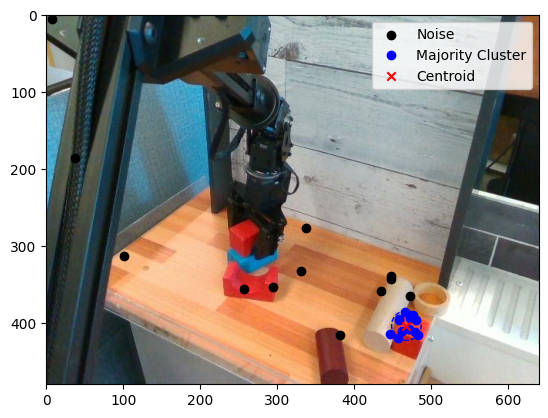

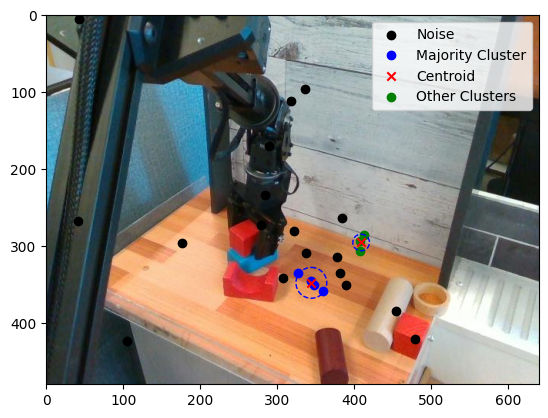


pick up vegetable and put it on the table.


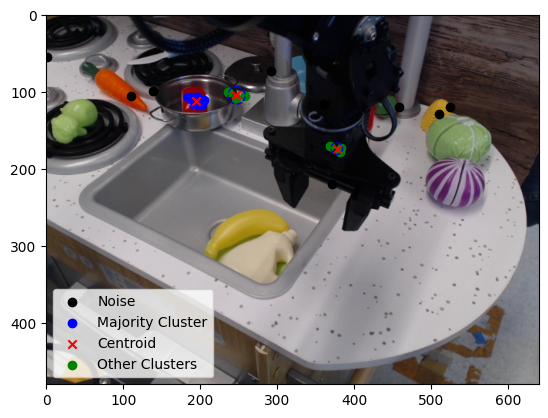

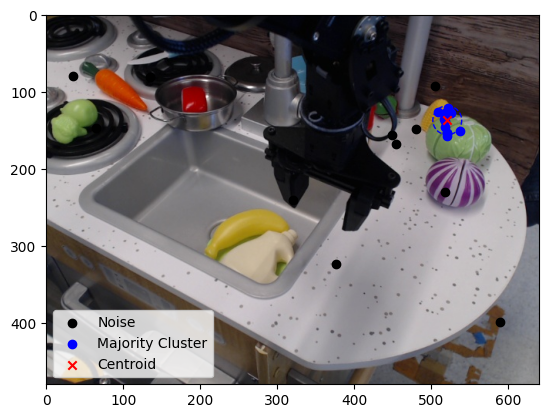


pick up glass cup


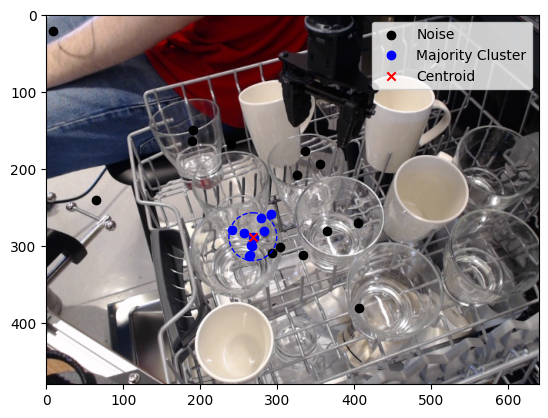


pick up red srewdriver


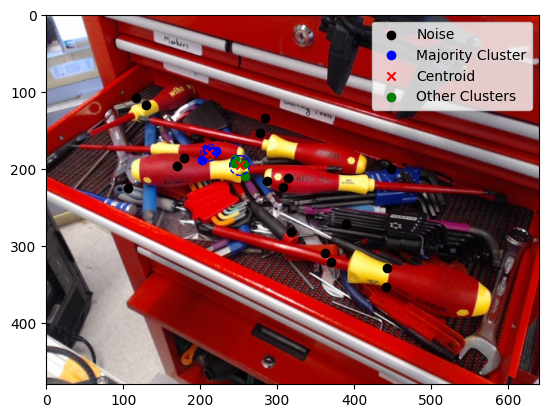


pick up the bean.


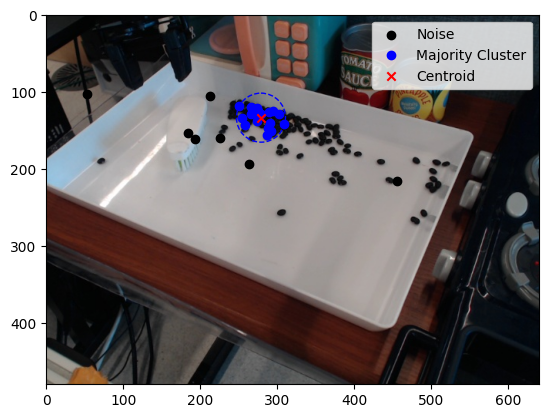


pick up the diamond.


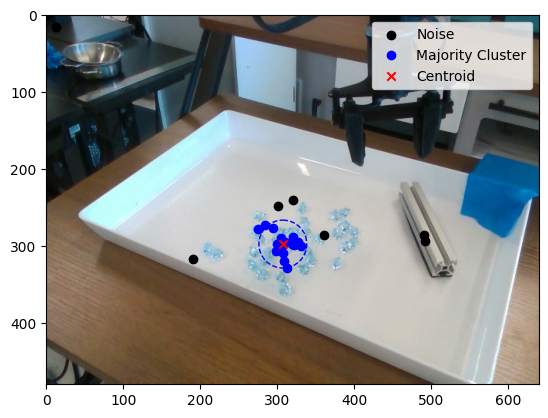


pick up vegetable and put it on the green cutting board.


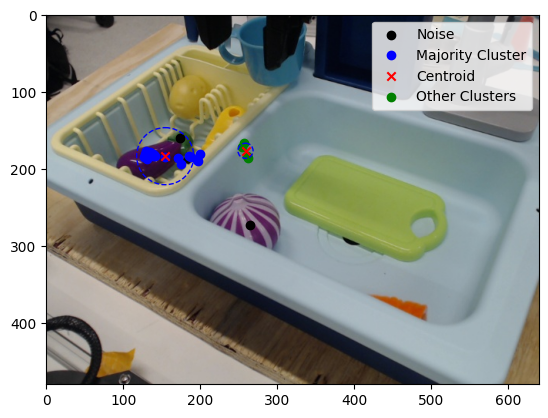

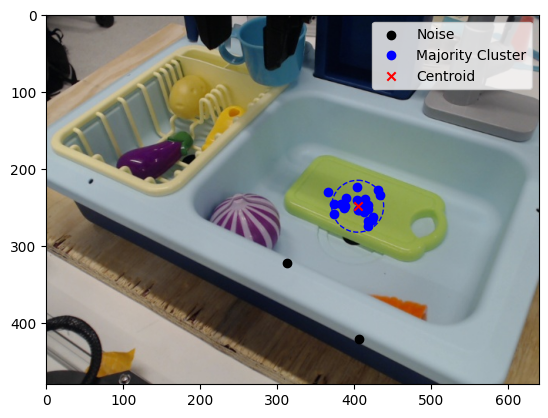


pick up cloth.


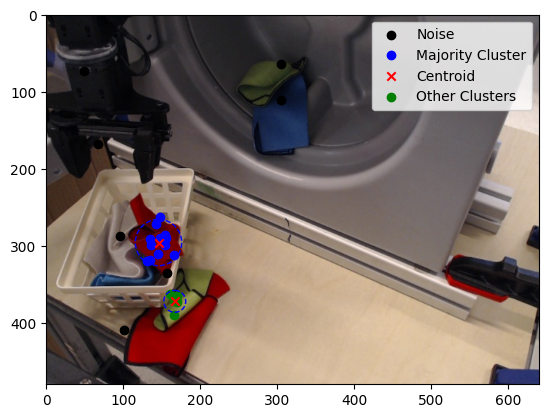


pick up vegetable from the sink and put it on the right side of the sink.


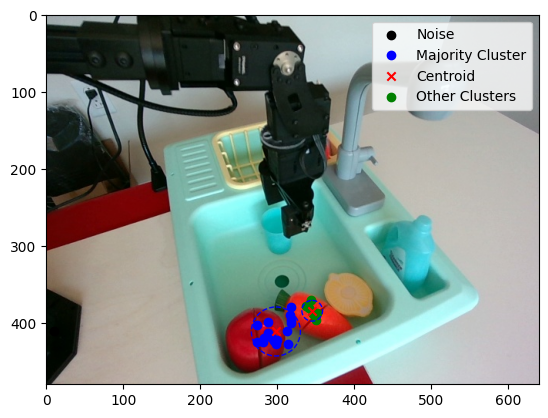

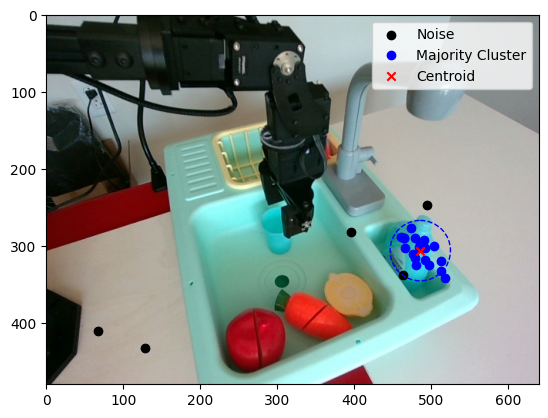


pick up the can and put it next to the tomato.


In [ ]:
experiment_path = "../data/uncertain_experiments"
num_runs = 5
temperature = 1

epsilon = 20
min_samples = 3

prompt_starts = [
    "You are the robot in the picture. Your mission it to guide and support the user in its task to: ",
    "Your mission it to guide and support the user in its task to: ",
    "You are the robot in the picture. You have to: ",
    "You are the robot. Your mission is to: ",
    "You are the robot in the picture. Your task is to: "
    ]

#prompt_starts = ["You are the robot in the picture. Your mission it to guide and support the user in its task to: ", "You are the robot in the picture. Your mission it to guide and support the user in its task to: "]
#prompt_ends = [, "  Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the place where the object has to be moved to. Dont output anything else."]

coordinates, distances, spreads, diameters, majority_size_rates = run_experiment_different_prompts(experiment_path, prompt_starts, num_runs, temperature, epsilon, min_samples)

In [ ]:
experiment_path = "../data/uncertain_experiments"
num_runs = 6
temperature = 1

epsilon = 20
min_samples = 3

prompt_starts = [
    "You are the robot in the picture. Your mission it to guide and support the user in its task to: ",
    "Your mission it to guide and support the user in its task to: ",
    "You are the robot in the picture. You have to: ",
    "You are the robot. Your mission is to: ",
    "You are the robot in the picture. Your task is to: "
    ]

#prompt_starts = ["You are the robot in the picture. Your mission it to guide and support the user in its task to: ", "You are the robot in the picture. Your mission it to guide and support the user in its task to: "]
#prompt_ends = [, "  Your output format should be like this: (x1, y1) with (x1, y1) beeing the coordinates of the place where the object has to be moved to. Dont output anything else."]

coordinates, distances, spreads, diameters, majority_size_rates = run_experiment_different_prompts(experiment_path, prompt_starts, num_runs, temperature, epsilon, min_samples)